# DATA2OO1 Assignment

# Project Overview

This project focuses on developing a "bustling" metric for the SA2 regions of Greater Sydney. The aim is to quantify how busy each district is based on various socio-economic and geographical data. This involves spatially integrating several datasets including business density, population distribution, public transport accessibility, and more.

## Data Sources

- **SA2 Regions:** Digital boundaries for the Statistical Area Level 2 regions, filtered to include only Greater Sydney.
- **Businesses:** Data on the number of businesses per industry in each region.
- **Public Transport Stops:** Locations of all train and bus stops.
- **Polls:** Locations of polling places from the 2019 Federal election.
- **Schools:** Catchment areas for educational institutions.
- **Population:** Demographic distribution by age and region.
- **Income:** Economic data showing earnings by region.

THIS PROJECT WAS MADE BY:

Name: Syed Ahmad Sabaat
SID: 510415790

Name: Frederic Max Serisier
SID: 530490355

Name: Duc Viet Hoang VU
SID: 530016546

### Importing the required modules


In [1]:
import pandas as pd
import geopandas as gpd

from geoalchemy2 import Geometry, WKTElement

from sqlalchemy import create_engine
from sqlalchemy import text

from shapely.geometry import Point, Polygon, MultiPolygon
from shapely import wkt
from shapely.wkt import loads as wkt_loads

import psycopg2
import psycopg2.extras

import json
import matplotlib.pyplot as plt
import plotly.express as px

### Retrieving our spatial data + cleaning



First, read the files into GeoPandas dataframes

In [2]:
sa2_boundaries = gpd.read_file('SA2_boundaries/SA2_2021_AUST_GDA2020.shp')
primary_catchments = gpd.read_file('catchments/catchments_primary.shp')
secondary_catchments = gpd.read_file('catchments/catchments_secondary.shp')
future_catchments = gpd.read_file('catchments/catchments_future.shp')

The below cell ensures that all our spatial datasets are using the same SRID - In our case, we used **4326**

In [3]:
srid = 4326
spatial_datasets = [sa2_boundaries, primary_catchments, secondary_catchments, future_catchments]


def set_srid(datasets, srid):
    for dataset in datasets:
        if dataset.crs.to_string() != f'EPSG:{srid}':
            dataset.to_crs(epsg=srid, inplace=True)
            

set_srid(spatial_datasets, srid)

Now we can begin cleaning. The catchment files were concatenated on the condition that future catchments are prioritised before other catchments. Redundant rows were also removed from the catchment files.

In [4]:
sa2_boundaries = sa2_boundaries[sa2_boundaries['GCC_NAME21'] == 'Greater Sydney']

primary_catchments = primary_catchments.drop(columns=['PRIORITY', 'KINDERGART', 'YEAR1', 'YEAR2', 'YEAR3', 'YEAR4', 'YEAR5', 'YEAR6', 'YEAR7', 'YEAR8', 'YEAR9', 'YEAR10', 'YEAR11', 'YEAR12', 'ADD_DATE'])
secondary_catchments = secondary_catchments.drop(columns=['PRIORITY', 'KINDERGART', 'YEAR1', 'YEAR2', 'YEAR3', 'YEAR4', 'YEAR5', 'YEAR6', 'YEAR7', 'YEAR8', 'YEAR9', 'YEAR10', 'YEAR11', 'YEAR12', 'ADD_DATE'])
future_catchments = future_catchments.drop(columns=['KINDERGART', 'YEAR1', 'YEAR2', 'YEAR3', 'YEAR4', 'YEAR5', 'YEAR6', 'YEAR7', 'YEAR8', 'YEAR9', 'YEAR10', 'YEAR11', 'YEAR12', 'ADD_DATE'])

combined_schools = pd.concat([primary_catchments, secondary_catchments])

schools = future_catchments.merge(combined_schools, on='USE_ID', how='right', suffixes=('_future', '_present'))

for col in future_catchments.columns:
    if col != 'USE_ID':
        schools[col] = schools[f'{col}_future'].combine_first(schools[f'{col}_present'])
        schools.drop(columns=[f'{col}_future', f'{col}_present'], inplace=True)

schools.reset_index(drop=True, inplace=True)


We now need to convert the polygons in our dataframes into WKT elements. In order to do this, we first make sure that they're all represented as multipolygons using create_wkt_element and then simply complete the conversion.

In [5]:
def create_wkt_element(geom, srid):
    if geom.geom_type == 'Polygon':
        geom = MultiPolygon([geom])
    return WKTElement(geom.wkt, srid)

def create_geometry(data):
    data = data.copy()
    data['geom'] = data['geometry'].apply(lambda geom: create_wkt_element(geom=geom, srid=srid))
    data = data.drop(columns=['geometry'])
    return data

schools = create_geometry(schools)
sa2_boundaries = create_geometry(sa2_boundaries)

### Retrieving our tabular data + cleaning

Read the files into Pandas dataframes

In [6]:
stops = pd.read_csv('Stops.txt')
income = pd.read_csv('Income.csv')
businesses = pd.read_csv('Businesses.csv')
polling_places = pd.read_csv('PollingPlaces2019.csv')
population = pd.read_csv('Population.csv')

Now, we rename columns in 'stops' for ease, replaced 'np' values in 'income' with null values and dropped unwanted columns in 'polling_places'. The unwanted columns were 'the_geom', which is unnecessary since we already have what we need to make a 'geom' column with latitude and longitude. The 'premises_state_abbreviation' column is unneeded as it simply repeats the value in the 'state' column.

In [7]:
stops.rename(columns={'stop_lat': 'latitude', 'stop_lon': 'longitude'}, inplace=True)

income = income.replace(to_replace='np', value=None)
income.rename(columns={'sa2_code21': 'SA2_CODE21'}, inplace=True)

population.rename(columns={'sa2_code': 'SA2_CODE21'}, inplace=True)

polling_places = polling_places.drop(columns=['the_geom', 'premises_state_abbreviation'])

businesses.rename(columns={'sa2_code': 'SA2_CODE21'}, inplace=True)

Turning the latitude and longitude columns in stops and polling_places into geometries:

In [8]:
def coords_to_geom(data):
    data['geom'] = gpd.points_from_xy(data.longitude, data.latitude)
    data = data.drop(columns=['latitude', 'longitude'])
    return data

stops = coords_to_geom(stops)
polling_places = coords_to_geom(polling_places)

Ensure that the srid's of the 'geom' columns in stops and polling_places match the srid of the one we are using across the database.

In [9]:
def change_srid(data):
    data['geom'] = data['geom'].apply(lambda x: WKTElement(x.wkt, srid=srid))
    return data

stops = change_srid(stops)
polling_places = change_srid(polling_places)

Connecting to our database using the helpful pgconnect() function

In [10]:
def pgconnect(credential_filepath, db_schema="public"):
    with open(credential_filepath) as f:
        db_conn_dict = json.load(f)
        host       = db_conn_dict['host']
        db_user    = db_conn_dict['user']
        db_pw      = db_conn_dict['password']
        default_db = db_conn_dict['database']
        port       = db_conn_dict['port']
        try:
            db = create_engine(f'postgresql+psycopg2://{db_user}:{db_pw}@{host}:{port}/{default_db}', echo=False)
            conn = db.connect()
            print('Connected successfully.')
        except Exception as e:
            print("Unable to connect to the database.")
            print(e)
            db, conn = None, None
        return db,conn

credentials = "Credentials.json"
db, conn = pgconnect(credentials)

Connected successfully.


Define create_schema() function - This function takes in the SQL code for creating the schema of a dataset, and executes it in our PostGreSQL database.

In [11]:
def create_schema(sql_commands):
    try:
        conn.execute(text(sql_commands))
        print("Transaction completed successfully.")
    except Exception as e:
        print("An error occurred, rolling back transaction.")
        conn.execute(text("ROLLBACK;"))
        print(e)

**The following cells define the schemas for all of our dataframes and then populates the dataframes using the .to_sql() function:**

In [12]:
sa2_schema = f"""
BEGIN;
DROP TABLE IF EXISTS sa2_boundaries CASCADE;
CREATE TABLE sa2_boundaries (
    "SA2_CODE21" INT PRIMARY KEY,
    "SA2_NAME21" VARCHAR(255),
    "CHG_FLAG21" INT,
    "CHG_LBL21" VARCHAR(255),
    "SA3_CODE21" INT,
    "SA3_NAME21" VARCHAR(255),
    "SA4_CODE21" INT,
    "SA4_NAME21" VARCHAR(255),
    "GCC_CODE21" VARCHAR(255),
    "GCC_NAME21" VARCHAR(255),
    "STE_CODE21" INT,
    "STE_NAME21" VARCHAR(255),
    "AUS_CODE21" VARCHAR(5),
    "AUS_NAME21" VARCHAR(255),
    "AREASQKM21" FLOAT,
    "LOCI_URI21" VARCHAR(255),
    "geom" GEOMETRY(MULTIPOLYGON, {srid})
);
COMMIT;
"""
create_schema(sa2_schema)
sa2_boundaries.to_sql("sa2_boundaries", conn, if_exists='append', index=False, dtype={'geom': Geometry('MULTIPOLYGON', srid)})

Transaction completed successfully.


373

In [13]:
schools_schema = f"""
BEGIN;
DROP TABLE IF EXISTS schools;
CREATE TABLE schools (
    "USE_ID" INT,
    "CATCH_TYPE" VARCHAR(255),
    "USE_DESC" VARCHAR(255),
    "ADD_DATE" VARCHAR(255),
    "geom" GEOMETRY(MULTIPOLYGON, {srid})
);
COMMIT;
"""
create_schema(schools_schema)
schools.to_sql("schools", conn, if_exists='append', index=False, dtype={'geom': Geometry('MULTIPOLYGON', srid)})

Transaction completed successfully.


98

In [14]:
businesses_schema = """
BEGIN;
DROP TABLE IF EXISTS businesses;

CREATE TABLE businesses (
    "industry_code" CHAR(1),
    "industry_name" VARCHAR(255),
    "SA2_CODE21" INT,
    "sa2_name" VARCHAR(255),
    "0_to_50k_businesses" INT,
    "50k_to_200k_businesses" INT,
    "200k_to_2m_businesses" INT,
    "2m_to_5m_businesses" INT,
    "5m_to_10m_businesses" INT,
    "10m_or_more_businesses" INT,
    "total_businesses" INT
);

COMMIT;

"""
create_schema(businesses_schema)
businesses.to_sql("businesses", conn, if_exists='append', index=False)

Transaction completed successfully.


217

In [15]:
income_schema = """
BEGIN;
DROP TABLE IF EXISTS income;

CREATE TABLE income (
    "SA2_CODE21" INT,
    "sa2_name" VARCHAR(255),
    "earners" INT,
    "median_age" INT,
    "median_income" INT,
    "mean_income" INT

);

CREATE INDEX idx_median_income ON income(median_income);

COMMIT;

"""
create_schema(income_schema)
income.to_sql("income", conn, if_exists='append', index=False)

Transaction completed successfully.


642

In [16]:
population_schema = """
BEGIN;
DROP TABLE IF EXISTS population;

CREATE TABLE population (
    "SA2_CODE21" INT,
    "sa2_name" VARCHAR(255),
    "0-4_people" INT,
    "5-9_people" INT,
    "10-14_people" INT,
    "15-19_people" INT,
    "20-24_people" INT,
    "25-29_people" INT,
    "30-34_people" INT,
    "35-39_people" INT,
    "40-44_people" INT,
    "45-49_people" INT,
    "50-54_people" INT,
    "55-59_people" INT,
    "60-64_people" INT,
    "65-69_people" INT,
    "70-74_people" INT,
    "75-79_people" INT,
    "80-84_people" INT,
    "85-and-over_people" INT,
    "total_people" INT
);

COMMIT;

"""
create_schema(population_schema)
population.to_sql("population", conn, if_exists='append', index=False)

Transaction completed successfully.


373

In [17]:
polling_places_schema = f"""
BEGIN;
DROP TABLE IF EXISTS polling_places;
CREATE TABLE polling_places (
    "FID" VARCHAR(255), 
    "state" CHAR(3),
    division_id INTEGER,
    division_name VARCHAR(255),
    polling_place_id INTEGER,
    polling_place_type_id INTEGER,
    polling_place_name VARCHAR(255),
    premises_name VARCHAR(255),
    premises_address_1 VARCHAR(255),
    premises_address_2 VARCHAR(255),
    premises_address_3 VARCHAR(255),
    premises_suburb VARCHAR(255),
    premises_post_code INTEGER,
    geom GEOMETRY(POINT, {srid})
);
COMMIT;
"""
create_schema(polling_places_schema)
polling_places.to_sql('polling_places', conn, if_exists='append', index=False, dtype={'geom': Geometry('POINT', srid)})

Transaction completed successfully.


930

In [18]:
stops_schema = f"""
BEGIN;
DROP TABLE IF EXISTS stops;
CREATE TABLE stops (
    "stop_id" VARCHAR(255),
    "stop_code" VARCHAR(255),
    "stop_name" VARCHAR(255),
    "location_type" INT,
    "parent_station" VARCHAR(255),
    "wheelchair_boarding" INT,
    "platform_code" VARCHAR(255),
    "geom" GEOMETRY(Point, {srid})
);
COMMIT;
"""
create_schema(stops_schema)
stops.to_sql("stops", conn, if_exists='append', index=False, dtype={'geom': Geometry('POINT', srid)})

Transaction completed successfully.


718

Below we define the query() function. This function takes in any SQL query we wish to run and runs it inside our database.

In [19]:
def query(conn, sqlcmd, args=None, df=True):
    result = pd.DataFrame() if df else None
    try:
        if df:
            result = pd.read_sql_query(sqlcmd, conn, params=args)
        else:
            result = conn.execute(text(sqlcmd), args).fetchall()
            result = result[0] if len(result) == 1 else result
    except Exception as e:
        print("Error encountered: ", e, sep='\n')
    return result


Before running queries, it is a good idea to set up spatial indexing on our SA2 boundaries.

In [20]:
query(conn, '''
CREATE INDEX idx_sa2_boundaries_geom ON sa2_boundaries USING GIST (geom);
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


Here we add the 'young_people' column to the population table. It is a column made from adding all the total people in the age range 0 - 19.

In [21]:
query(conn, '''
ALTER TABLE population
DROP COLUMN IF EXISTS "young_people" ;
ALTER TABLE population
ADD COLUMN "young_people" INT;
UPDATE population
SET "young_people" = "0-4_people" + "5-9_people" + "10-14_people" + "15-19_people";
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


Here, we will add an 'SA2_CODE21' column to the polling_places and stops datasets. This is done by seeing which sa2 region our geometry point is contained within in our sa2_boundaries dataframe using ST_Contains() and then filling in the value accordingly.

In [22]:
query(conn, '''
ALTER TABLE polling_places
DROP COLUMN IF EXISTS "SA2_CODE21";
ALTER TABLE polling_places
ADD COLUMN "SA2_CODE21" INT;
UPDATE polling_places pp
SET "SA2_CODE21" = sb."SA2_CODE21"
FROM
    sa2_boundaries sb
WHERE
    ST_Contains(sb."geom", pp."geom");
''')

query(conn, '''
ALTER TABLE stops
DROP COLUMN IF EXISTS "SA2_CODE21";
ALTER TABLE stops
ADD COLUMN "SA2_CODE21" INT;
UPDATE stops
SET "SA2_CODE21" = sb."SA2_CODE21"
FROM
    sa2_boundaries sb
WHERE
    ST_Contains(sb."geom", stops."geom");
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.
Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [23]:
query(conn, '''
DROP TABLE IF EXISTS stops_per_sqkm_per_sa2;

CREATE TABLE stops_per_sqkm_per_sa2 AS
SELECT
    a."SA2_CODE21",
    COALESCE(COUNT(s."SA2_CODE21"), 0) AS "stop_count",
    COALESCE(COUNT(s."SA2_CODE21") / NULLIF(a."AREASQKM21", 0), 0) AS "stops_per_sqkm"
FROM
    sa2_boundaries a
LEFT JOIN stops s
    ON a."SA2_CODE21" = s."SA2_CODE21"
GROUP BY
    a."SA2_CODE21", a."AREASQKM21"
ORDER BY
    a."SA2_CODE21";

''')


Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [24]:
query(conn, '''
DROP TABLE IF EXISTS polls_per_sqkm_per_sa2;

CREATE TABLE polls_per_sqkm_per_sa2 AS
SELECT
    a."SA2_CODE21",
    COALESCE(COUNT(p."SA2_CODE21"), 0) AS "poll_count",
    COALESCE(COUNT(p."SA2_CODE21") / a."AREASQKM21", 0) AS "polls_per_sqkm"
FROM
    sa2_boundaries a
LEFT JOIN polling_places p
    ON a."SA2_CODE21" = p."SA2_CODE21"
GROUP BY
    a."SA2_CODE21", a."AREASQKM21"
ORDER BY
    a."SA2_CODE21";

''')


Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [25]:
query(conn, '''
DROP TABLE IF EXISTS schools_per_sa2;

CREATE TABLE schools_per_sa2 AS
SELECT
  sa2."SA2_CODE21",
  p."young_people",
  sa2."AREASQKM21",
  CAST(COUNT(DISTINCT sch."geom") AS FLOAT) / NULLIF(p."young_people", 0) * 1e+03 AS "number_of_schools_per_1000_young_people",
  CAST(COUNT(DISTINCT sch."geom") AS FLOAT) / NULLIF(p."young_people", 0) * 1e+03 / sa2."AREASQKM21" AS "number_of_schools_per_1000_young_people_per_sqkm",
  COUNT(DISTINCT sch."geom") AS "number_of_schools"

FROM
  sa2_boundaries sa2
LEFT JOIN
  schools sch
ON
  ST_Intersects(sa2."geom", sch."geom")
LEFT JOIN
  population p
ON
  sa2."SA2_CODE21" = p."SA2_CODE21"

GROUP BY
  sa2."SA2_CODE21", p."young_people", sa2."AREASQKM21";


''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [26]:
query(conn, '''
DROP TABLE IF EXISTS businesses_per_1000;

CREATE TABLE businesses_per_1000 AS
SELECT 
    s."SA2_CODE21",
    SUM(CASE 
        WHEN b."industry_name" = 'Retail Trade' THEN CAST(b."total_businesses" AS FLOAT) * 0.30
        WHEN b."industry_name" = 'Arts and Recreation Services' THEN CAST(b."total_businesses" AS FLOAT) * 0.20
        WHEN b."industry_name" = 'Accommodation and Food Services' THEN CAST(b."total_businesses" AS FLOAT) * 0.50
        ELSE 0 
    END) AS "total_businesses_in_selected_industries",
    COALESCE(NULLIF(p."total_people", 0), 1) AS "total_people",
    (1000 * SUM(CASE 
        WHEN b."industry_name" = 'Retail Trade' THEN CAST(b."total_businesses" AS FLOAT) * 0.30
        WHEN b."industry_name" = 'Arts and Recreation Services' THEN CAST(b."total_businesses" AS FLOAT) * 0.20
        WHEN b."industry_name" = 'Accommodation and Food Services' THEN CAST(b."total_businesses" AS FLOAT) * 0.50
        ELSE 0 
    END) / COALESCE(NULLIF(p."total_people", 0), 1)) AS "businesses_per_1000_people",
    (1000 * SUM(CASE 
        WHEN b."industry_name" = 'Retail Trade' THEN CAST(b."total_businesses" AS FLOAT) * 0.30
        WHEN b."industry_name" = 'Arts and Recreation Services' THEN CAST(b."total_businesses" AS FLOAT) * 0.20
        WHEN b."industry_name" = 'Accommodation and Food Services' THEN CAST(b."total_businesses" AS FLOAT) * 0.50
        ELSE 0 
    END) / COALESCE(NULLIF(p."total_people", 0), 1)) / COALESCE(s."AREASQKM21", 1) AS "businesses_per_1000_people_per_sqkm"

FROM 
    sa2_boundaries s
    LEFT JOIN businesses b ON s."SA2_CODE21" = b."SA2_CODE21"
    LEFT JOIN population p ON s."SA2_CODE21" = p."SA2_CODE21"
WHERE 
    b."industry_name" IN ('Retail Trade', 'Arts and Recreation Services', 'Accommodation and Food Services')
GROUP BY
    s."SA2_CODE21", p."total_people", s."AREASQKM21"
ORDER BY s."SA2_CODE21";
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


# Additional Datasets

In [27]:
public_amenities = gpd.read_file('public_amenities.geojson')
crossings = gpd.read_file('crossings.geojson')

set_srid([public_amenities, crossings], srid)

public_amenities = create_geometry(public_amenities)
crossings = create_geometry(crossings)

public_amenities = public_amenities[['geom']]
crossings = crossings[['geom']]

In [28]:
traffic_lights = pd.read_csv('traffic-lights-location-data-may-2021.csv')

traffic_lights.rename(columns={'Latitude': 'latitude', 'Longitude': 'longitude'}, inplace=True)

traffic_lights = coords_to_geom(traffic_lights)
traffic_lights = change_srid(traffic_lights)
traffic_lights = traffic_lights.drop(columns = ['Asset_Type', 'Equipment_ID', 'Date_Install', 'STREET_1', 'STREET_2', 'RMS_Region'])

In [29]:
public_amenities_schema = f"""
BEGIN;
DROP TABLE IF EXISTS public_amenities;
CREATE TABLE public_amenities (
    geom GEOMETRY(POINT, {srid})
);
COMMIT;
"""
create_schema(public_amenities_schema)
public_amenities.to_sql("public_amenities", conn, if_exists='append', index=False, dtype={'geom': Geometry('POINT', srid)})

Transaction completed successfully.


595

In [30]:
crossings_schema = f"""
BEGIN;
DROP TABLE IF EXISTS crossings;
CREATE TABLE crossings (
    geom GEOMETRY(POINT, {srid})
);
COMMIT;
"""
create_schema(crossings_schema)
crossings.to_sql("crossings", conn, if_exists='append', index=False, dtype={'geom': Geometry('POINT', srid)})

Transaction completed successfully.


825

In [31]:
traffic_lights_schema = f"""
BEGIN;
DROP TABLE IF EXISTS traffic_lights;
CREATE TABLE traffic_lights (
    "Suburb" VARCHAR(255),
    geom GEOMETRY(POINT, {srid})
);
COMMIT;
"""
create_schema(traffic_lights_schema)
traffic_lights.to_sql('traffic_lights', conn, if_exists='append', index=False, dtype={'geom': Geometry('POINT', srid)})

Transaction completed successfully.


325

In [32]:
query(conn, '''
ALTER TABLE public_amenities
DROP COLUMN IF EXISTS "SA2_CODE21";
ALTER TABLE public_amenities
ADD COLUMN "SA2_CODE21" INT;
UPDATE public_amenities p
SET "SA2_CODE21" = sb."SA2_CODE21"
FROM
    sa2_boundaries sb
WHERE
    ST_Contains(sb."geom", p."geom");
''')

query(conn, '''
ALTER TABLE crossings
DROP COLUMN IF EXISTS "SA2_CODE21";
ALTER TABLE crossings
ADD COLUMN "SA2_CODE21" INT;
UPDATE crossings c
SET "SA2_CODE21" = sb."SA2_CODE21"
FROM
    sa2_boundaries sb
WHERE
    ST_Contains(sb."geom", c."geom");
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.
Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [33]:
query(conn, '''
DROP TABLE IF EXISTS public_amenities_per_sqkm_per_sa2;

CREATE TABLE public_amenities_per_sqkm_per_sa2 AS
SELECT
    a."SA2_CODE21",
    COALESCE(COUNT(p."SA2_CODE21"), 0) AS "public_amenities_count",
    COALESCE(COUNT(p."SA2_CODE21") / a."AREASQKM21", 0) AS "public_amenities_per_sqkm"
FROM
    sa2_boundaries a
LEFT JOIN public_amenities p
    ON a."SA2_CODE21" = p."SA2_CODE21"
GROUP BY
    a."SA2_CODE21", a."AREASQKM21"
ORDER BY
    a."SA2_CODE21";

''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [34]:
query(conn, '''
DROP TABLE IF EXISTS crossings_per_sqkm_per_sa2;

CREATE TABLE crossings_per_sqkm_per_sa2 AS
SELECT
    a."SA2_CODE21",
    COALESCE(COUNT(c."SA2_CODE21"), 0) AS "crossings_count",
    COALESCE(COUNT(c."SA2_CODE21") / a."AREASQKM21", 0) AS "crossings_per_sqkm"
FROM
    sa2_boundaries a
LEFT JOIN crossings c
    ON a."SA2_CODE21" = c."SA2_CODE21"
GROUP BY
    a."SA2_CODE21", a."AREASQKM21"
ORDER BY
    a."SA2_CODE21";

''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [35]:
query(conn, '''
ALTER TABLE traffic_lights
DROP COLUMN IF EXISTS "SA2_CODE21";
ALTER TABLE traffic_lights
ADD COLUMN "SA2_CODE21" INT;
UPDATE traffic_lights t
SET "SA2_CODE21" = sb."SA2_CODE21"
FROM
    sa2_boundaries sb
WHERE
    ST_Contains(sb."geom", t."geom");
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [36]:
query(conn, '''
DROP TABLE IF EXISTS traffic_lights_per_sqkm_per_sa2;

CREATE TABLE traffic_lights_per_sqkm_per_sa2 AS
SELECT
    a."SA2_CODE21",
    COALESCE(COUNT(t."SA2_CODE21"), 0) AS "traffic_light_count",
    COALESCE(COUNT(t."SA2_CODE21") / a."AREASQKM21", 0) AS "traffic_lights_per_sqkm"
FROM
    sa2_boundaries a
LEFT JOIN traffic_lights t
    ON a."SA2_CODE21" = t."SA2_CODE21"
GROUP BY
    a."SA2_CODE21", a."AREASQKM21"
ORDER BY
    a."SA2_CODE21";
''')


Error encountered: 
This result object does not return rows. It has been closed automatically.


""


In [37]:
query(conn, f'''
DROP TABLE IF EXISTS bustling_scores;

CREATE TABLE bustling_scores AS
SELECT
    pop."total_people",
    i."median_income",
    s."SA2_CODE21",
    s."SA2_NAME21",
    p."polls_per_sqkm",
    (p."polls_per_sqkm" - AVG(p."polls_per_sqkm") OVER()) / STDDEV_POP(p."polls_per_sqkm") OVER() AS z_polls_per_sqkm,
    stops."stops_per_sqkm",
    (stops."stops_per_sqkm" - AVG(stops."stops_per_sqkm") OVER()) / STDDEV_POP(stops."stops_per_sqkm") OVER() AS z_stops_per_sqkm,
    b."businesses_per_1000_people_per_sqkm",
    (b."businesses_per_1000_people_per_sqkm" - AVG(b."businesses_per_1000_people_per_sqkm") OVER()) / STDDEV_POP(b."businesses_per_1000_people_per_sqkm") OVER() AS z_businesses_per_1000_per_sqkm,
    sch."number_of_schools_per_1000_young_people_per_sqkm",
    (sch."number_of_schools_per_1000_young_people_per_sqkm" - AVG(sch."number_of_schools_per_1000_young_people_per_sqkm") OVER()) / STDDEV_POP(sch."number_of_schools_per_1000_young_people_per_sqkm") OVER() AS z_number_of_schools_per_1000_young_people_per_sqkm,
    t."traffic_lights_per_sqkm",
    (t."traffic_lights_per_sqkm" - AVG(t."traffic_lights_per_sqkm") OVER()) / STDDEV_POP(t."traffic_lights_per_sqkm") OVER() AS z_lights_per_sqkm,
    pub."public_amenities_per_sqkm",
    (pub."public_amenities_per_sqkm" - AVG(pub."public_amenities_per_sqkm") OVER()) / STDDEV_POP(pub."public_amenities_per_sqkm") OVER() AS z_public_amenities_per_sqkm,
    c."crossings_per_sqkm",
    (c."crossings_per_sqkm" - AVG(c."crossings_per_sqkm") OVER()) / STDDEV_POP(c."crossings_per_sqkm") OVER() AS z_crossings_per_sqkm,


    1 / (1 + EXP(-(
        (p."poll_count" - AVG(p."poll_count") OVER()) / STDDEV_POP(p."poll_count") OVER() +
        (stops."stops_per_sqkm" - AVG(stops."stops_per_sqkm") OVER()) / STDDEV_POP(stops."stops_per_sqkm") OVER() +
        (b."businesses_per_1000_people_per_sqkm" - AVG(b."businesses_per_1000_people_per_sqkm") OVER()) / STDDEV_POP(b."businesses_per_1000_people_per_sqkm") OVER() +
        (sch."number_of_schools_per_1000_young_people_per_sqkm" - AVG(sch."number_of_schools_per_1000_young_people_per_sqkm") OVER()) / STDDEV_POP(sch."number_of_schools_per_1000_young_people_per_sqkm") OVER() +
        (t."traffic_lights_per_sqkm" - AVG(t."traffic_lights_per_sqkm") OVER()) / STDDEV_POP(t."traffic_lights_per_sqkm") OVER() +
        (pub."public_amenities_per_sqkm" - AVG(pub."public_amenities_per_sqkm") OVER()) / STDDEV_POP(pub."public_amenities_per_sqkm") OVER() +
        (c."crossings_per_sqkm" - AVG(c."crossings_per_sqkm") OVER()) / STDDEV_POP(c."crossings_per_sqkm") OVER()
    )/7)) AS "bustling_score",
    s."geom"
FROM
    sa2_boundaries s
    LEFT JOIN polls_per_sqkm_per_sa2 p ON s."SA2_CODE21" = p."SA2_CODE21"
    LEFT JOIN stops_per_sqkm_per_sa2 stops ON s."SA2_CODE21" = stops."SA2_CODE21"
    LEFT JOIN businesses_per_1000 b ON s."SA2_CODE21" = b."SA2_CODE21"
    LEFT JOIN schools_per_sa2 sch ON s."SA2_CODE21" = sch."SA2_CODE21"
    LEFT JOIN traffic_lights_per_sqkm_per_sa2 t ON s."SA2_CODE21" = t."SA2_CODE21"
    LEFT JOIN population pop ON s."SA2_CODE21" = pop."SA2_CODE21"
    LEFT JOIN public_amenities_per_sqkm_per_sa2 pub ON s."SA2_CODE21" = pub."SA2_CODE21"
    LEFT JOIN income i ON s."SA2_CODE21" = i."SA2_CODE21"
    LEFT JOIN crossings_per_sqkm_per_sa2 c ON s."SA2_CODE21" = c."SA2_CODE21"

WHERE
    pop."young_people" > 100
''')

Error encountered: 
This result object does not return rows. It has been closed automatically.


""


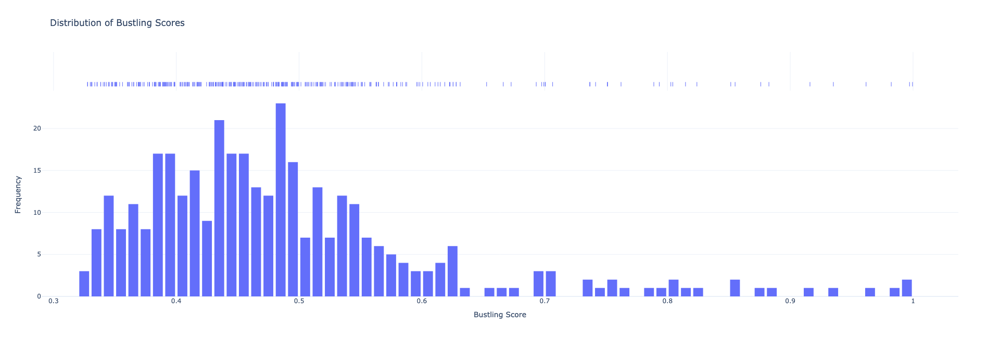

In [38]:
new_table_query = '''
select * from bustling_scores
'''
bustling_scores = gpd.read_postgis(new_table_query, conn, geom_col="geom")

fig = px.histogram(bustling_scores, 
                   x='bustling_score', 
                   nbins=70,
                   title='Distribution of Bustling Scores',
                   labels={'bustling_score': 'Bustling Score'},
                   marginal='rug',
                   color_discrete_sequence=['#636EFA']) 

fig.update_layout(
    xaxis_title='Bustling Score',
    yaxis_title='Frequency',
    bargap=0.2, 
    template='plotly_white',
    height=650  
)
fig.show()

In [39]:
query(conn, '''
select * from bustling_scores order by bustling_score desc
''')

,total_people,median_income,SA2_CODE21,SA2_NAME21,polls_per_sqkm,z_polls_per_sqkm,stops_per_sqkm,z_stops_per_sqkm,businesses_per_1000_people_per_sqkm,z_businesses_per_1000_per_sqkm,number_of_schools_per_1000_young_people_per_sqkm,z_number_of_schools_per_1000_young_people_per_sqkm,traffic_lights_per_sqkm,z_lights_per_sqkm,public_amenities_per_sqkm,z_public_amenities_per_sqkm,crossings_per_sqkm,z_crossings_per_sqkm,bustling_score,geom
0,8199,62966,117031644,Sydney (North) - Millers Point,19.924040,9.928539,55.725048,2.025376,40.399702,11.687329,3.928241,1.223177,28.329494,6.108730,61.951311,10.655234,15.565656,8.023044,0.999568,0106000020E6100000030000000103000000010000000E...
1,20346,35875,117031645,Sydney (South) - Haymarket,24.976873,12.578385,71.230342,3.093246,22.215123,6.214345,4.865585,1.627132,44.403330,9.929671,41.628122,7.003555,14.801110,7.601999,0.997146,0106000020E610000001000000010300000001000000B1...
2,7956,47437,117031639,Chippendale,2.154244,0.609568,25.850926,-0.032094,20.064036,5.566935,34.074156,14.214775,17.233951,3.471188,10.771219,1.459174,8.616975,4.196312,0.982249,0106000020E6100000010000000103000000010000007E...
3,10776,77084,117031329,Darlinghurst,8.168981,3.763863,65.351850,2.688386,16.850852,4.599868,9.487783,3.619102,24.506944,5.200064,9.335979,1.201289,9.335979,4.592276,0.961758,0106000020E610000001000000010300000001000000A8...
4,7558,41075,117031646,Ultimo,1.789549,0.418312,42.949177,1.145485,20.670499,5.749462,13.660680,5.417441,17.895490,3.628444,14.316392,2.096172,3.579098,1.421884,0.935116,0106000020E61000000100000001030000000100000079...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354,11257,59217,122021421,Bayview - Elanora Heights,0.015484,-0.512056,2.864531,-1.615197,0.064098,-0.452415,0.051461,-0.447549,0.030968,-0.618164,0.123872,-0.453946,0.000000,-0.549174,0.331217,0106000020E6100000020000000103000000010000006E...
355,3798,61222,122031432,Terrey Hills - Duffys Forest,0.014176,-0.512742,1.587666,-1.703137,0.095549,-0.442949,0.210901,-0.378837,0.042527,-0.615416,0.070878,-0.463468,0.000000,-0.549174,0.330694,0106000020E610000001000000010300000001000000AC...
356,4941,56422,102021051,Ourimbah - Fountaindale,0.008763,-0.515581,1.112891,-1.735835,0.035470,-0.461031,0.090771,-0.430608,0.052578,-0.613027,0.008763,-0.474629,0.157733,-0.462308,0.329921,0106000020E610000001000000010300000001000000F4...
357,4774,60739,127011726,Cobbitty - Bringelly,0.013538,-0.513077,0.771670,-1.759336,0.031761,-0.462147,0.173696,-0.394871,0.067690,-0.609435,0.000000,-0.476203,0.013538,-0.541718,0.327832,0106000020E61000000100000001030000000100000035...


# Comparing to median income

In [40]:
query(conn, '''
SELECT CORR("bustling_score", "median_income") AS correlation_coefficient
FROM bustling_scores;
''')

,correlation_coefficient
0,0.158244


In [41]:
import folium

geojson_data = bustling_scores.to_json()

m = folium.Map(location=[-33.8688, 151.2093], zoom_start=9)

def color_scale(amount):
    if amount is None:
        return '#d3d3d3'
    elif amount > 0.8:
        return '#d73027'
    elif amount > 0.6:
        return '#fc8d59'
    elif amount > 0.4:
        return '#fee08b'
    elif amount > 0.2:
        return '#d9ef8b'
    else:
        return '#91cf60'

folium.GeoJson(
    geojson_data,
    name='Bustling Score',
    style_function=lambda feature: {
        'fillColor': color_scale(feature['properties']['bustling_score']),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7,
    },
    popup=folium.GeoJsonPopup(fields=['SA2_NAME21', 'bustling_score'], aliases=['Region:', 'Bustling Score:']),
).add_to(m)


folium.LayerControl().add_to(m)

In [42]:
m

In [43]:
m.save('bustling_score_map.html')
